Procedure:
1. Split data into labeled, unlabeled, and test
2. Train model on labeled
3. Define partition of labeled that will be removed due to privacy regulations
4. Select the partition of unlabeled to be labeled in order to maximize accuracy and consistency


Methods to compare
0. Label random data
1. Label data that the model is the most uncertain about (close to 0.5)
2. If labels are skewed, label what we predict to be in the minority class
3. Label data that is most similar to that which will be deleted
4. Label data that is most similar to that which will be deleted (look at K nearest neighbors and select the one with highest uncertainty, e.g. k = 5)

Models to test:
1. xg boost, har en active learning package

# Next steps: 
- add more methods
- Output results: how F1 score changed, how consitency scored changed, how coefficients of logisitc regression change also compare variable importance of random forest etc.

- Make timeline of how each point removed change consistency
- If you use gradient boosting trees, check if model supports categorical variables then don't create dummy variables, search: which models support categorical variables

## Libraries

In [69]:
# LOAD LIBRARIES
import numpy as np  # linear algebra
import pandas as pd  # data processing, CSV file I/O (e.g. pd.read_csv)
import random


# Load libraries for Decision Tree
import pandas as pd
from sklearn.tree import DecisionTreeClassifier  # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split  # Import train_test_split function
from sklearn import metrics  #Import scikit-learn metrics module for accuracy calculation
from sklearn.preprocessing import scale

# Load libraries for Decision Tree Model Plot
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO
from IPython.display import Image
import pydotplus

# Load libaries for various model performance metrics
from sklearn.metrics import f1_score, roc_curve, roc_auc_score, confusion_matrix, average_precision_score, precision_recall_curve
from matplotlib import pyplot as plt
from inspect import signature

# Load libaries for logistic regression
from matplotlib import pyplot as plt
from sklearn.linear_model import LogisticRegression
import seaborn as sns
sns.set()
#from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import pandas as pd

from scipy.spatial import distance

In [70]:
cancer = pd.read_csv('cancer.csv')
cancer = cancer.drop(columns = ['Unnamed: 32', 'id'])
cancer.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [61]:
len(cancer)

569

In [73]:
scale(cancer)

array([[ 1.29767572,  1.09706398, -2.07333501, ...,  2.29607613,
         2.75062224,  1.93701461],
       [ 1.29767572,  1.82982061, -0.35363241, ...,  1.0870843 ,
        -0.24388967,  0.28118999],
       [ 1.29767572,  1.57988811,  0.45618695, ...,  1.95500035,
         1.152255  ,  0.20139121],
       ...,
       [ 1.29767572,  0.70228425,  2.0455738 , ...,  0.41406869,
        -1.10454895, -0.31840916],
       [ 1.29767572,  1.83834103,  2.33645719, ...,  2.28998549,
         1.91908301,  2.21963528],
       [-0.77060855, -1.80840125,  1.22179204, ..., -1.74506282,
        -0.04813821, -0.75120669]])

In [72]:
cancer.loc[cancer.diagnosis == 'M','diagnosis'] = 1
cancer.loc[cancer.diagnosis == 'B','diagnosis'] = 0

In [60]:
active_learning(cancer)

(0.9484536082474228, 0.9473684210526315, 0.008771929824561403)

# Data Import & Clean
TODO: find more datasets https://archive.ics.uci.edu/ml/index.php

In [16]:
def get_credit_card_data(path):
    data = pd.read_csv(path, sep=',')
    
    is_fraud = data.Class
    prepared_data = data.drop(columns=['Class'])
    prepared_data.insert(0, 'is_fraud', is_fraud)
    
    return prepared_data

credit_data = get_credit_card_data('creditcard.csv')
credit_data.head()

,is_fraud,Time,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62
1,0,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69
2,0,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66
3,0,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50
4,0,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99


## Cencus Income Data Prep

In [18]:
def get_census_data(path_train, path_test):
    # import:
    columns = [
        "age", "workClass", "fnlwgt", "education", "education-num",
        "marital-status", "occupation", "relationship", "race", "sex",
        "capital-gain", "capital-loss", "hours-per-week", "native-country",
        "income"
    ]
    census_train = pd.read_csv(path_train,
                               names=columns,
                               sep=' *, *',
                               na_values='?')
    census_test = pd.read_csv(path_test,
                              names=columns,
                              sep=' *, *',
                              skiprows=1,
                              na_values='?')

    census = pd.concat([census_train, census_test], axis=0)
    
    # clean:
    census['income'] = census['income'].map(lambda x: x.replace('.', ''))
    
    census['income_over_50K'] = None
    census.loc[census.income == '<=50K', 'income_over_50K'] = 0
    census.loc[census.income == '>50K', 'income_over_50K'] = 1
    
    income_over_50K = census.income_over_50K
    census = census.drop(columns=['income_over_50K', 'income'])
    census.insert(0, 'income_over_50K', income_over_50K)
    
    census = census.drop(columns = ['fnlwgt']) # does not have anything to do with data
    
    # Making native-country to country_USA feature instead:
    census['country_USA'] = 0
    census.loc[census['native-country'] == 'United-States', 'country_USA'] = 1
    census = census.drop(columns=['native-country'])
    
    census_with_dummies = pd.get_dummies(data= census,columns=census.select_dtypes(include=['object']).columns,drop_first=True)
    
    return census, census_with_dummies

def explore_data(data, label):    
    num_attributes = data.select_dtypes(include=['int'])
    print('Numerical features: ' + str(num_attributes.columns))
    
    num_attributes.hist(figsize=(10,10))
    
    print(data.describe())
    
    cat_attributes = data.select_dtypes(include=['object'])
    print('Categorical features: ' + str(cat_attributes.columns))
    
    for column in cat_attributes:
        if column != 'income':
            sns.countplot(y=column, hue=data[label], data = cat_attributes)
            plt.show()
    
census, census_with_dummies = get_census_data('adult.data', 'adult.test')




/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:12: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  if sys.path[0] == '':
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.


Numerical features: Index(['income_over_50K', 'age', 'education-num', 'capital-gain',
       'capital-loss', 'hours-per-week', 'country_USA'],
      dtype='object')
       income_over_50K           age  education-num  capital-gain  \
count     48842.000000  48842.000000   48842.000000  48842.000000   
mean          0.239282     38.643585      10.078089   1079.067626   
std           0.426649     13.710510       2.570973   7452.019058   
min           0.000000     17.000000       1.000000      0.000000   
25%           0.000000     28.000000       9.000000      0.000000   
50%           0.000000     37.000000      10.000000      0.000000   
75%           0.000000     48.000000      12.000000      0.000000   
max           1.000000     90.000000      16.000000  99999.000000   

       capital-loss  hours-per-week   country_USA  
count  48842.000000    48842.000000  48842.000000  
mean      87.502314       40.422382      0.897424  
std      403.004552       12.391444      0.303407  
min  

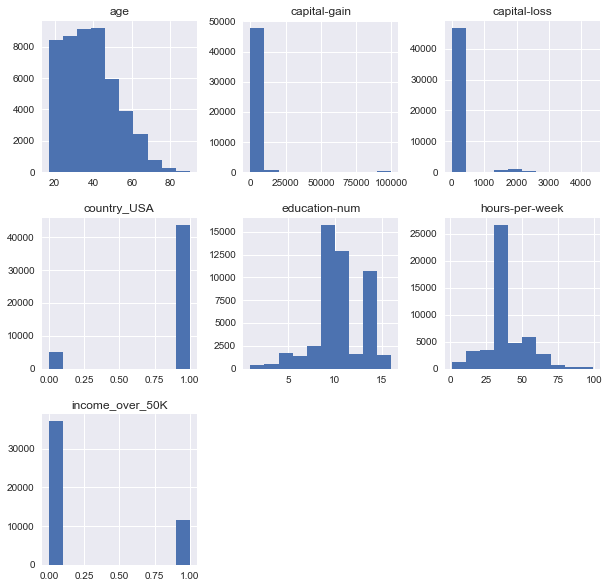

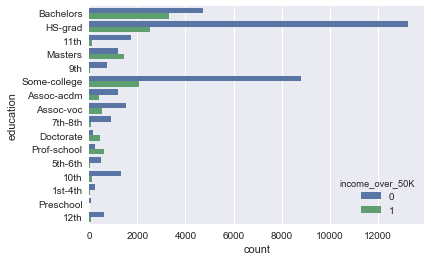

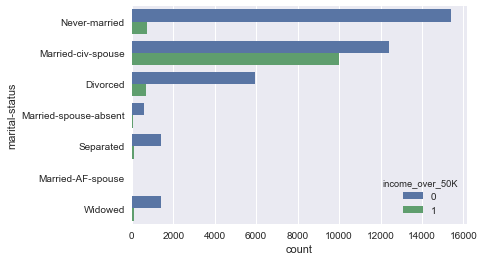

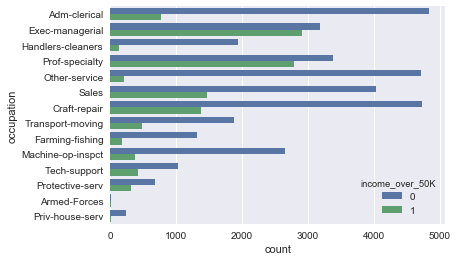

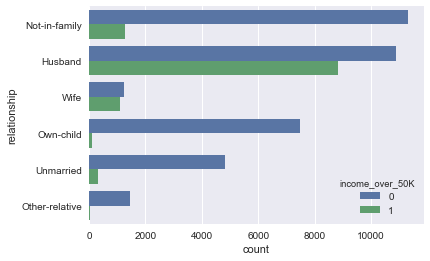

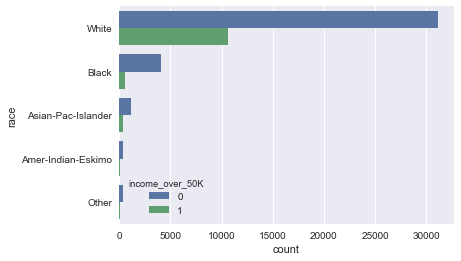

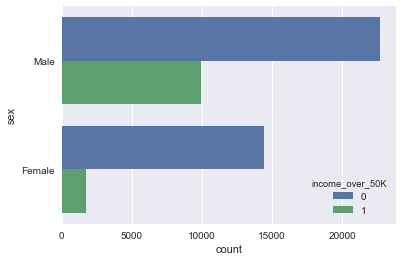

In [19]:
explore_data(census, 'income_over_50K')

In [20]:
#explore_data(credit_data, 'is_fraud')

In [21]:
census_with_dummies.head()

,income_over_50K,age,education-num,capital-gain,capital-loss,hours-per-week,country_USA,workClass_Local-gov,workClass_Never-worked,workClass_Private,...,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Asian-Pac-Islander,race_Black,race_Other,race_White,sex_Male
0,0,39,13,2174,0,40,1,0,0,0,...,1,0,0,0,0,0,0,0,1,1
1,0,50,13,0,0,13,1,0,0,0,...,0,0,0,0,0,0,0,0,1,1
2,0,38,9,0,0,40,1,0,0,1,...,1,0,0,0,0,0,0,0,1,1
3,0,53,7,0,0,40,1,0,0,1,...,0,0,0,0,0,0,1,0,0,1
4,0,28,13,0,0,40,0,0,0,1,...,0,0,0,0,1,0,1,0,0,0


# Method Definitions

In [77]:
# DEFINE FUNCTIONS
def split_method_final_test(data, seed=300):
    method_set = data.sample(frac=1 - FINAL_TEST_SET_FRACTION,
                             random_state=seed)
    final_test_set = data.drop(method_set.index)

    return method_set, final_test_set


def split_labeled_unlabeled(data, seed=200):
    labeled = data.sample(frac=1 - UNLABELED_FRACTION, random_state=seed)
    unlabeled = data.drop(labeled.index)

    return labeled, unlabeled


def split_train_test(data, seed=150):
    train = data.sample(frac=TRAIN_FRACTION, random_state=seed)
    test = data.drop(train.index)

    train_y = train.iloc[:, 0]
    train_x = train.drop(train.columns[0], axis=1)

    test_y = test.iloc[:, 0]
    test_x = test.drop(test.columns[0], axis=1)

    return train_x, train_y, test_x, test_y


def split_keep_delete(data, seed=100):
    keep = data.sample(frac=1 - DELETE_FRACTION, random_state=seed)
    delete = data.drop(keep.index)

    return keep, delete


def train_tree(data):
    train_x, train_y, test_x, test_y = split_train_test(data)

    # Create Decision Tree classifer object
    clf = DecisionTreeClassifier(min_samples_leaf=5,
                                 min_impurity_decrease=0.000001)

    # Train Decision Tree Classifer
    clf = clf.fit(train_x, train_y)

    #Predict the response for test dataset
    predict_y = clf.predict(test_x)

    feature_names = train_x.columns
    class_names = train_y.unique()

    #plot_tree(clf, feature_names, class_names)
    # Model Accuracy, how often is the classifier correct?
    print("Accuracy:", metrics.accuracy_score(test_y, predict_y))
    print(confusion_matrix(test_y, predict_y))
    plot_tree_ROC(clf, test_x, test_y)
    plot_tree(clf, feature_names, class_names)

    y_scores = clf.predict_proba(test_x)[:, 1]

    average_precision = average_precision_score(test_y, y_scores)
    print('Average precision-recall score: {0:0.2f}'.format(average_precision))

    precision, recall, _ = precision_recall_curve(test_y, y_scores)
    # In matplotlib < 1.5, plt.fill_between does not have a 'step' argument
    step_kwargs = ({
        'step': 'post'
    } if 'step' in signature(plt.fill_between).parameters else {})
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall, precision, alpha=0.2, color='b', **step_kwargs)

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(
        average_precision))


def plot_tree(clf, feature_names, class_names):
    dot_data = StringIO()
    export_graphviz(clf,
                    out_file=dot_data,
                    filled=True,
                    rounded=True,
                    special_characters=True,
                    feature_names=feature_names,
                    class_names=['0', '1'])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    graph.write_png('tree.png')
    display(Image(graph.create_png()))


def plot_tree_ROC(clf, test_x, test_y):
    prob_predictions = clf.predict_proba(test_x)
    print('AUC: ' + str(roc_auc_score(test_y, prob_predictions[:, 1])))

    fpr, tpr, _ = roc_curve(test_y, prob_predictions[:, 1])

    plt.clf()
    plt.plot(fpr, tpr)
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.title('ROC curve')
    plt.show()


def train_logistic_regression(data, prints=True):
    train_x, train_y, test_x, test_y = split_train_test(data)

    # TODO: add n-fold CV and then train on whole labeled set after parameters set
    # don't run CV after each additional point

    # possible to set class weight to combat skewed data
    # also possible to adjust regularization parameters

    lr = LogisticRegression()

    lr.fit(train_x, train_y)

    if prints:
        print('Coefficients: ', lr.coef_)
        print('Interecept: ', lr.intercept_)

        predict_y = lr.predict(test_x)
        print('Confusion matrix: ', '\n', confusion_matrix(test_y, predict_y))

    return lr


def label_uncertain_data(lr, unlabeled, number_of_new_points):
    unlabeled_x = unlabeled.drop(unlabeled.columns[0], axis=1)
    prob_predictions = lr.predict_proba(unlabeled_x)
    prob_for_1 = prob_predictions[:, 1]

    unlabeled['abs_uncertainty'] = np.abs(prob_for_1 - 0.5)
    #unlabeled.abs_uncertainty.plot.hist()

    new_data = unlabeled.sort_values(
        'abs_uncertainty').iloc[0:number_of_new_points]
    new_unlabeled = unlabeled.sort_values(
        'abs_uncertainty').iloc[number_of_new_points:len(unlabeled)]

    new_data = new_data.drop(columns='abs_uncertainty')
    new_unlabeled = new_unlabeled.drop(columns='abs_uncertainty')

    return new_data, new_unlabeled


def active_learning(prepared_data,
                    active_learning_method='uncertainty',
                    seeds=[200, 150, 100]):

    # Splitting data
    method_data, final_test = split_method_final_test(prepared_data,
                                                      seed=seeds[0])
    labeled, unlabeled = split_labeled_unlabeled(method_data, seed=seeds[1])
    keep, delete = split_keep_delete(labeled, seed=seeds[2])

    # Train original model
    lr = LogisticRegression()
    current_lr = LogisticRegression()
    
    labeled_y = labeled.iloc[:, 0]
    labeled_x = labeled.drop(labeled.columns[0], axis=1)

    lr.fit(scale(labeled_x), labeled_y)
    current_lr.fit(scale(labeled_x), labeled_y)
    
    # Label new points:
    number_of_points_to_add = len(unlabeled) * ADD_FRACTION
    number_of_new_points = 0

    current_unlabeled = unlabeled.copy()
    current_labeled = labeled.copy()
    new_data = pd.DataFrame()

    if active_learning_method == 'uncertainty':

        while number_of_new_points < number_of_points_to_add:
            # This is very slow now because we train model again for each new point:
            step_size = 25
            number_of_new_points += step_size

            new_points, new_unlabeled = label_uncertain_data(
                current_lr, current_unlabeled, step_size)

            current_labeled = pd.concat([current_labeled, new_points], axis=0)
            current_unlabeled = new_unlabeled.copy()

            current_labeled_y = current_labeled.iloc[:, 0]
            current_labeled_x = current_labeled.drop(
                current_labeled.columns[0], axis=1)

            current_lr.fit(scale(current_labeled_x), current_labeled_y)

            new_data.append(new_points)

    # Code to get all data at once instead of one at a time:
    #new_data = label_uncertain_data(lr, unlabeled, number_of_new_points)
    else:
        print('active_learning_method not defined')

    # TODO: take 50 and 50 samples from different clusters
    # another method is to cluster data and then add one point from each cluster

    final_test_y = final_test.iloc[:, 0]
    final_test_x = final_test.drop(final_test.columns[0], axis=1)

    final_test_x = scale(final_test_x)
    
    original_predict = lr.predict(final_test_x)
    new_predict = current_lr.predict(final_test_x)

    original_F1 = f1_score(final_test_y, original_predict)
    new_F1 = f1_score(final_test_y, new_predict)

    # Calculate consistency
    keep_y = keep.iloc[:, 0]
    keep_x = keep.drop(keep.columns[0], axis=1)

    predict_original = lr.predict(keep_x)
    predict_new = current_lr.predict(keep_x)

    # TODO: also do this on TEST set instead of overlapping training set

    consistency = np.mean(np.abs(predict_original -
                                 predict_new))  # MEAN ABSOLUTE ERROR

    return original_F1, new_F1, consistency

In [75]:
# SET GLOBAL CONSTANTS:
FINAL_TEST_SET_FRACTION = 0.3
UNLABELED_FRACTION = 0.95
TRAIN_FRACTION = 0.75
DELETE_FRACTION = 0 # TODO: CHANGE THIS WHEN APPLYING PRIVACY
ADD_FRACTION = 0.5

In [78]:
active_learning(census_with_dummies)

(0.6533650982727814, 0.2489270386266095, 0.0)

In [13]:
f1s = []
ITERATIONS = 5
for i in range(ITERATIONS):
    print(str(round(100*i / ITERATIONS)) + '% complete')
    f1s.append(active_learning(census_with_dummies, seeds = [i, i+1, i+2]))
print('100% complete')
print(f1s)

0% complete
20% complete
40% complete
60% complete
80% complete
100% complete
[(0.6461232604373757, 0.6458022851465475, 0.012568958653244611), (0.6765285996055226, 0.6799999999999999, 0.014957629528521867), (0.6573354069466044, 0.6516971279373369, 0.01353580162657112), (0.645925925925926, 0.6494794248884482, 0.007393505090143889), (0.6663400293973543, 0.6692913385826773, 0.011772735028152192)]


In [30]:
pd.DataFrame(f1s).to_csv('F1scores_2.csv')

In [68]:
pd.scale(census_with_dummies)

AttributeError: module 'pandas' has no attribute 'scale'

# Running Methods

Accuracy: 0.8483960267057482
[[4325  369]
 [ 562  885]]
AUC: 0.8427601263681466


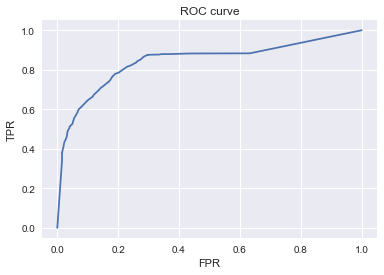

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.424284 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.424284 to fit



Average precision-recall score: 0.70


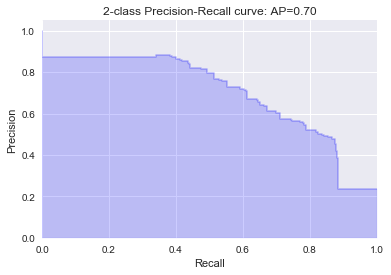

In [34]:
train_tree(cencus_clean)

In [167]:
pd.DataFrame(f1s).to_csv('F1scores.csv')